Objective : 
 The main objective of this analysis is to train multiple classification models in a stellar classification dataset  the focus of the analysis well be prediction and then highlighting the factors that differentiae between different celestial bodies and use that result to aid future observations and analysis . 
Plan: 
First the data well be run through normal data exploration and cleaning process then the data well be used to fit logistic regression , decision tree, random forest , and a bagging classifier. The accuracy recall precision and f1 score well be calculated and then the roc curve and confusion matrix well both be plotted . 
The best performing model well be selected by criteria of performance and explain-ability and then be used to get the feature impact on selecting each class.  


In [1]:
import skillsnetwork
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pylab as plt
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import MinMaxScaler
from scipy.stats import norm
from scipy import stats
import os
import numpy as np
import pandas as pd
import skillsnetwork
from scipy.stats import boxcox
import numpy as np
import pickle
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.model_selection import GridSearchCV
import keras 
from sklearn.preprocessing import StandardScaler, PolynomialFeatures
from sklearn.model_selection import KFold, cross_val_predict
from sklearn.linear_model import LinearRegression, Lasso, Ridge
from sklearn.metrics import r2_score
from sklearn.pipeline import Pipeline
from sklearn import preprocessing
from sklearn.metrics import classification_report, accuracy_score, confusion_matrix, precision_recall_fscore_support, precision_score, recall_score

path='data/star_classification.csv'
data=pd.read_csv(path ,)

Dataset : 
The data set was downloaded form Kaggle website and  consists of 100,000 observations of space taken by the SDSS (Sloan Digital Sky Survey). Every observation is described by 17 feature columns and 1 class column which identifies it to be either a star, galaxy or quasar. 
obj_ID = Object Identifier, the unique value that identifies the object in the image catalog used by the CAS alpha = Right Ascension angle (at J2000 epoch) delta = Declination angle (at J2000 epoch) u = Ultraviolet filter in the photometric system g = Green filter in the photometric system r = Red filter in the photometric system i = Near Infrared filter in the photometric system z = Infrared filter in the photometric system run_ID = Run Number used to identify the specific scan rereun_ID = Rerun Number to specify how the image was processed cam_col = Camera column to identify the scanline within the run field_ID = Field number to identify each field 
spec_obj_ID = Unique ID used for optical spectroscopic objects (this means that 2 different observations with the same spec_obj_ID must share the output class) 
class = object class (galaxy, star or quasar object) redshift = redshift value based on the increase in wavelength plate = plate ID, identifies each plate in SDSS 
MJD = Modified Julian Date, used to indicate when a given piece of SDSS data was taken fiber_ID = fiber ID that identifies the fiber that pointed the light at the focal plane in each observation it is noticed that some column record data about the observation operation and this data might serve little purpose in classifying the celestial objects and the analysis will prove that it is safe to discard them when using the data for prediction. 
the objective of this analysis is to figure out which of these columns provide useful information in differentiating between the celestial bodies and which of them can be ignored to save resources . 

In [2]:
data.describe()

,obj_ID,alpha,delta,u,g,r,i,z,run_ID,rerun_ID,cam_col,field_ID,spec_obj_ID,redshift,plate,MJD,fiber_ID
count,1.000000e+05,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.0,100000.000000,100000.000000,1.000000e+05,100000.000000,100000.000000,100000.000000,100000.000000
mean,1.237665e+18,177.629117,24.135305,21.980468,20.531387,19.645762,19.084854,18.668810,4481.366060,301.0,3.511610,186.130520,5.783882e+18,0.576661,5137.009660,55588.647500,449.312740
std,8.438560e+12,96.502241,19.644665,31.769291,31.750292,1.854760,1.757895,31.728152,1964.764593,0.0,1.586912,149.011073,3.324016e+18,0.730707,2952.303351,1808.484233,272.498404
min,1.237646e+18,0.005528,-18.785328,-9999.000000,-9999.000000,9.822070,9.469903,-9999.000000,109.000000,301.0,1.000000,11.000000,2.995191e+17,-0.009971,266.000000,51608.000000,1.000000
25%,1.237659e+18,127.518222,5.146771,20.352353,18.965230,18.135828,17.732285,17.460677,3187.000000,301.0,2.000000,82.000000,2.844138e+18,0.054517,2526.000000,54234.000000,221.000000
50%,1.237663e+18,180.900700,23.645922,22.179135,21.099835,20.125290,19.405145,19.004595,4188.000000,301.0,4.000000,146.000000,5.614883e+18,0.424173,4987.000000,55868.500000,433.000000
75%,1.237668e+18,233.895005,39.901550,23.687440,22.123767,21.044785,20.396495,19.921120,5326.000000,301.0,5.000000,241.000000,8.332144e+18,0.704154,7400.250000,56777.000000,645.000000
max,1.237681e+18,359.999810,83.000519,32.781390,31.602240,29.571860,32.141470,29.383740,8162.000000,301.0,6.000000,989.000000,1.412694e+19,7.011245,12547.000000,58932.000000,1000.000000


In [3]:
data.info()


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100000 entries, 0 to 99999
Data columns (total 18 columns):
 #   Column       Non-Null Count   Dtype  
---  ------       --------------   -----  
 0   obj_ID       100000 non-null  float64
 1   alpha        100000 non-null  float64
 2   delta        100000 non-null  float64
 3   u            100000 non-null  float64
 4   g            100000 non-null  float64
 5   r            100000 non-null  float64
 6   i            100000 non-null  float64
 7   z            100000 non-null  float64
 8   run_ID       100000 non-null  int64  
 9   rerun_ID     100000 non-null  int64  
 10  cam_col      100000 non-null  int64  
 11  field_ID     100000 non-null  int64  
 12  spec_obj_ID  100000 non-null  float64
 13  class        100000 non-null  object 
 14  redshift     100000 non-null  float64
 15  plate        100000 non-null  int64  
 16  MJD          100000 non-null  int64  
 17  fiber_ID     100000 non-null  int64  
dtypes: float64(10), int64(7),

data exploration : 
first the data was checked for null and duplicate values and dealt and none were found . then general inspection of the data was performed by the describe() function and box plotting all the numerical columns. 
  
 It was noted that most of the columns  don’t have many outliers. And the few outlier were dealt with by removal. 
Then the average of each feature grouped by class was bar plotted and it was noted that most columns have slight average difference between classes and the ones with notable difference are 

  
The correlation between different columns was also found and the columns with the highest correlation were 
  
Then the class distributions was inspected and it was (galaxy:0.59445, star: 0.21594 ,quasar:0.18961)  slightly unbalanced . it was decided to test the models on the raw data first  and if  the performance was lacking the data well be processed by some sampling method . 
Then the skew was checked and dealt with by a log transform. And the data was scaled with a standard scalar. 
It was decided to first use the models on the data without adding 2nd degree features and they may be added later if needed. 


(array([ 1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16, 17]),
 [Text(1, 0, 'obj_ID'),
  Text(2, 0, 'alpha'),
  Text(3, 0, 'delta'),
  Text(4, 0, 'u'),
  Text(5, 0, 'g'),
  Text(6, 0, 'r'),
  Text(7, 0, 'i'),
  Text(8, 0, 'z'),
  Text(9, 0, 'run_ID'),
  Text(10, 0, 'rerun_ID'),
  Text(11, 0, 'cam_col'),
  Text(12, 0, 'field_ID'),
  Text(13, 0, 'spec_obj_ID'),
  Text(14, 0, 'redshift'),
  Text(15, 0, 'plate'),
  Text(16, 0, 'MJD'),
  Text(17, 0, 'fiber_ID')])

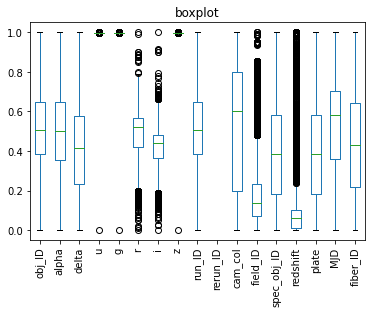

In [5]:
df= data.select_dtypes(include = ['float64', 'int64'])
df_norm = (df-df.min())/(df.max()-df.min())
plt.rcParams["figure.figsize"] = (10,7.5)
ax = df_norm.plot(kind='box', title='boxplot')
plt.xticks(rotation='vertical')

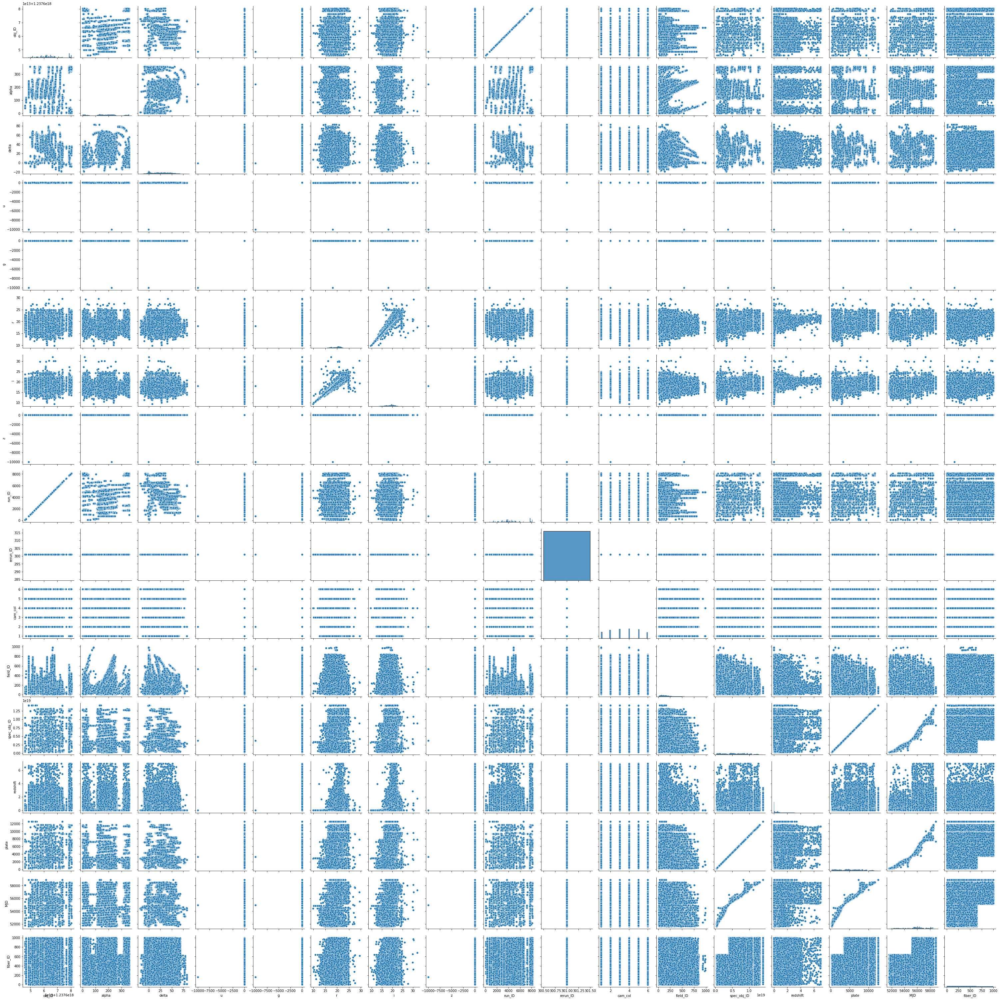

In [6]:
sns.pairplot(df,)

In [7]:
data['class'].unique()
label_encoder = preprocessing.LabelEncoder()
  
# Encode labels in column 'species'.
data['class']= label_encoder.fit_transform(data['class'])

In [7]:
data['class'].unique()

array([0, 1, 2])

In [4]:
datacorr=data.corr()

c = data.corr().abs()

upper_corr_mat = c.where(
    np.triu(np.ones(c.shape), k=1).astype(np.bool))
top_features = upper_corr_mat[abs(upper_corr_mat) > 0.75]
  
# Convert to 1-D series and drop Null values
unique_corr_pairs = top_features.unstack().dropna()
  
# Sort correlation pairs
sorted_mat = unique_corr_pairs.sort_values(ascending=False)
sorted_mat=pd.DataFrame(sorted_mat, columns=['c'])
sorted_mat.reset_index(inplace=True)
sorted_mat.rename(columns={'c':'corr'})
sorted_mat = sorted_mat.drop(sorted_mat[(sorted_mat['c'] ==1)].index)
sorted_mat

c:\users\hp\pycharmprojects\pythonproject5\lib\site-packages\ipykernel_launcher.py:6: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  


,level_0,level_1,c
0,plate,spec_obj_ID,1.000000
1,run_ID,obj_ID,1.000000
2,g,u,0.999311
3,z,g,0.999161
4,z,u,0.998093
5,MJD,spec_obj_ID,0.970167
6,MJD,plate,0.970166
7,i,r,0.962868


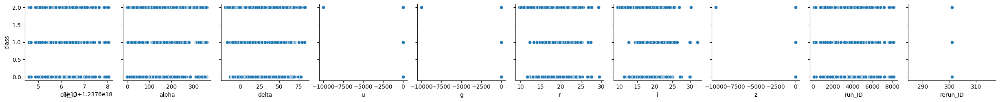

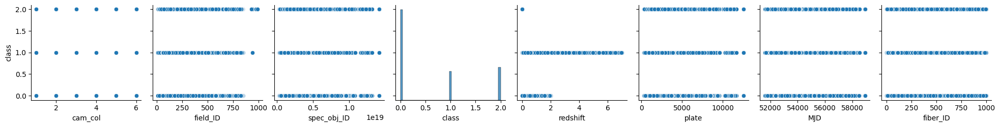

In [178]:
dt_num = data.select_dtypes(include = ['float64', 'int64','int32'  ])
dt_num_corr = dt_num.corr()['class'][:-1]
for i in range(0, len(dt_num.columns), 10):
    sns.pairplot(data=dt_num,
                x_vars=dt_num.columns[i:i+10],
                y_vars=['class'])

In [9]:
data.head()

,obj_ID,alpha,delta,u,g,r,i,z,run_ID,rerun_ID,cam_col,field_ID,spec_obj_ID,class,redshift,plate,MJD,fiber_ID
0,1.237661e+18,135.689107,32.494632,23.87882,22.27530,20.39501,19.16573,18.79371,3606,301,2,79,6.543777e+18,0,0.634794,5812,56354,171
1,1.237665e+18,144.826101,31.274185,24.77759,22.83188,22.58444,21.16812,21.61427,4518,301,5,119,1.176014e+19,0,0.779136,10445,58158,427
2,1.237661e+18,142.188790,35.582444,25.26307,22.66389,20.60976,19.34857,18.94827,3606,301,2,120,5.152200e+18,0,0.644195,4576,55592,299
3,1.237663e+18,338.741038,-0.402828,22.13682,23.77656,21.61162,20.50454,19.25010,4192,301,3,214,1.030107e+19,0,0.932346,9149,58039,775
4,1.237680e+18,345.282593,21.183866,19.43718,17.58028,16.49747,15.97711,15.54461,8102,301,3,137,6.891865e+18,0,0.116123,6121,56187,842


<AxesSubplot:>

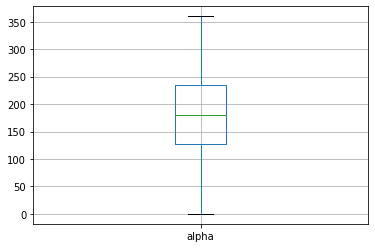

In [10]:
data.boxplot('alpha')

<AxesSubplot:>

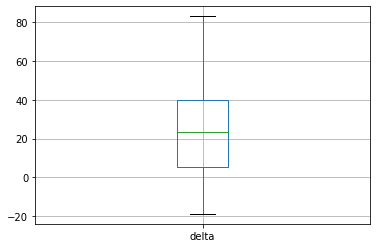

In [11]:
data.boxplot('delta')

<AxesSubplot:>

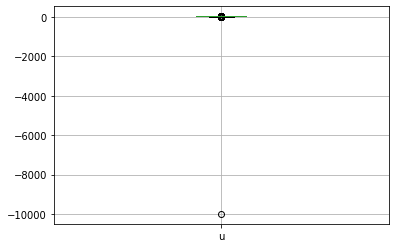

In [12]:
data.boxplot('u')

In [13]:
data.sort_values(by = 'u', ascending = True)[:20]
data1 = data.drop(data[(data['u'] <10.99623)].index)

<AxesSubplot:>

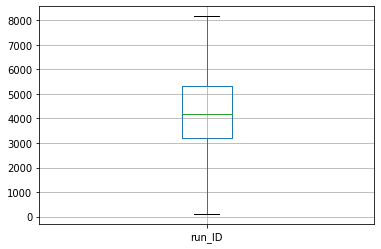

In [14]:
data1.boxplot('run_ID')

<AxesSubplot:>

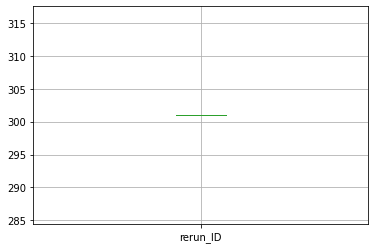

In [15]:
data1.boxplot('rerun_ID')

<AxesSubplot:>

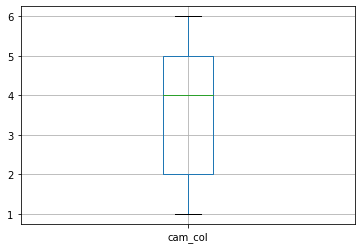

In [16]:
data1.boxplot('cam_col')

<AxesSubplot:>

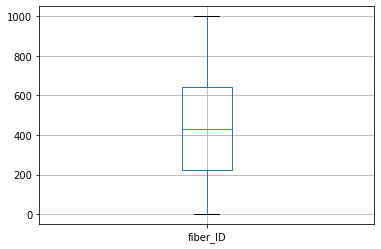

In [17]:
data1.boxplot('fiber_ID')

In [18]:
data.duplicated().sum()

0

In [19]:
data.columns

Index(['obj_ID', 'alpha', 'delta', 'u', 'g', 'r', 'i', 'z', 'run_ID',
       'rerun_ID', 'cam_col', 'field_ID', 'spec_obj_ID', 'class', 'redshift',
       'plate', 'MJD', 'fiber_ID'],
      dtype='object')

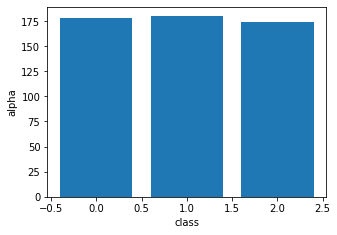

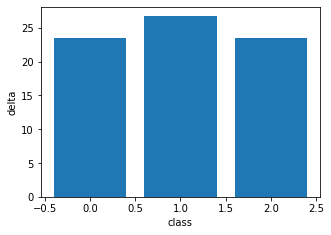

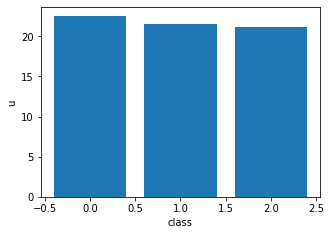

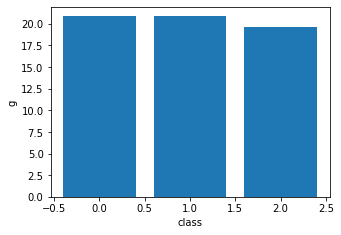

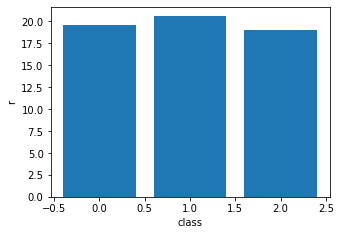

...

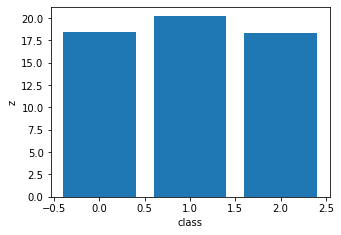

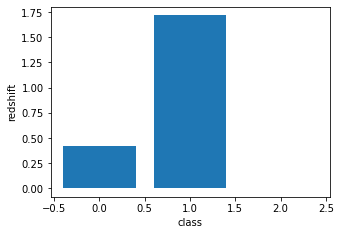

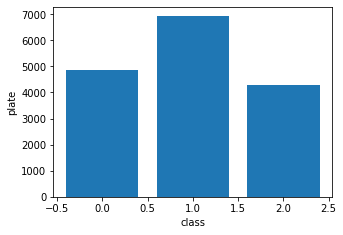

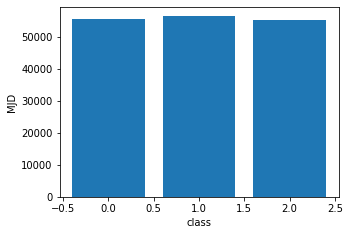

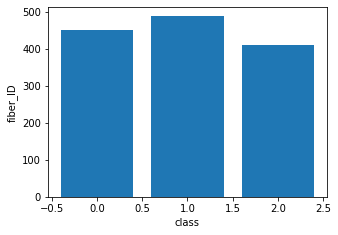

<Figure size 360x252 with 0 Axes>

In [20]:
for col in ['alpha', 'delta', 'u', 'g', 'r', 'i', 'z','redshift',
       'plate', 'MJD', 'fiber_ID',]:
  plt.rcParams["figure.figsize"] = (5,3.5)   
  t=data1.groupby('class').mean()
  t.reset_index(inplace=True)
  ax = plt.axes()
  ax.bar(t['class'],t[col])
  ax.set(xlabel='class', 
       ylabel=col)
 
  plt.figure()

In [21]:
dt_num = data1.select_dtypes(include = ['float64', 'int64','int32'])
dt_num_corr = dt_num.corr()['class'][:] # -1 means that the latest row is SalePrice
top_features = dt_num_corr[abs(dt_num_corr) > .0].sort_values(ascending=False) #displays pearsons correlation coefficient greater than 0.5
print("There is {} strongly correlated values with SalePrice:\n{}".format(len(top_features), top_features))


There is 17 strongly correlated values with SalePrice:
class          1.000000
z              0.066738
cam_col        0.023154
i              0.015039
delta          0.014474
MJD           -0.000400
plate         -0.010049
spec_obj_ID   -0.010050
alpha         -0.011764
field_ID      -0.034874
obj_ID        -0.035981
run_ID        -0.035983
fiber_ID      -0.041569
redshift      -0.054226
r             -0.076754
g             -0.229703
u             -0.272681
Name: class, dtype: float64


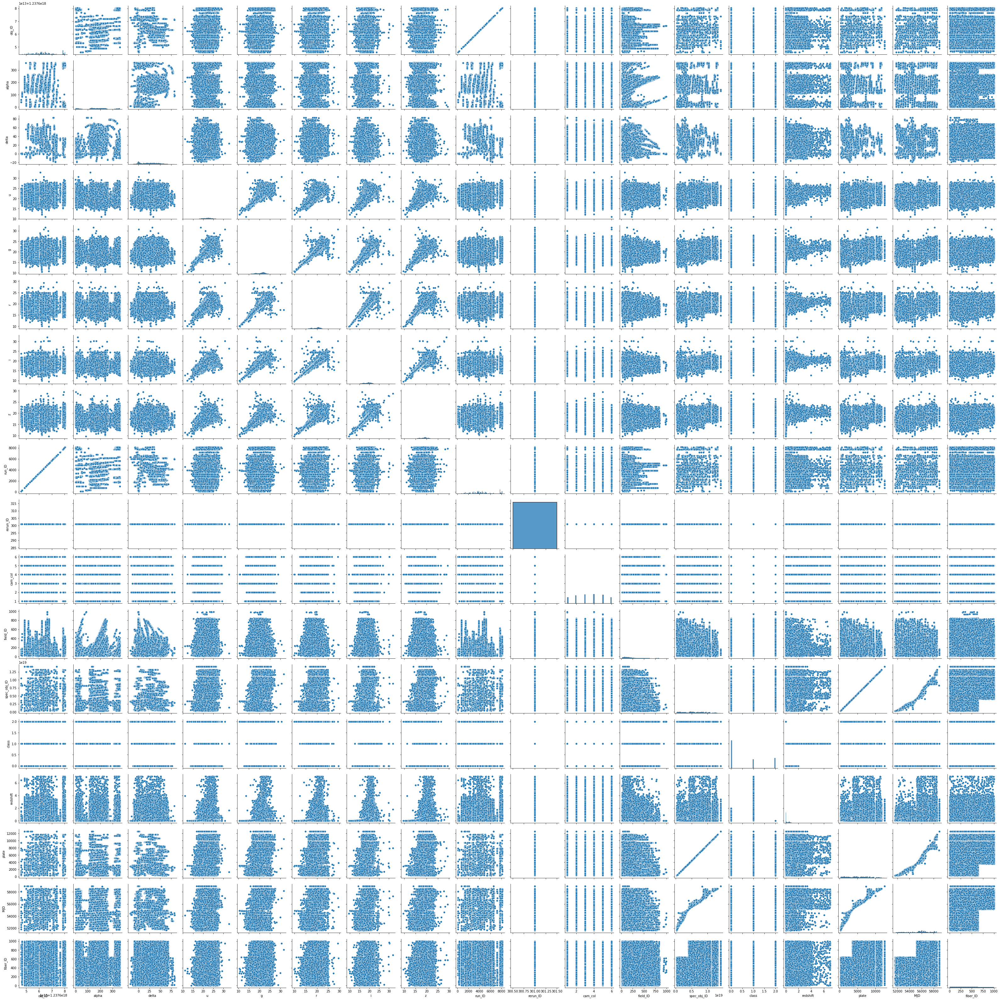

In [22]:
sns.pairplot(dt_num)

In [23]:
skevals=dt_num.skew()
skew_limit = 0.75 # define a limit above which we will log transform

skew_cols = (skevals
             
             .to_frame()
             .rename(columns={0:'Skew'})
             .query('abs(Skew) > {}'.format(skew_limit)))
skew_cols.reset_index(inplace=True)
skew_cols

,index,Skew
0,field_ID,1.753502
1,class,0.795171
2,redshift,2.523599


In [24]:


data1['redshift']=  np.sqrt(data1['redshift'])


c:\users\hp\pycharmprojects\pythonproject5\lib\site-packages\pandas\core\series.py:726: RuntimeWarning: invalid value encountered in sqrt
  result = getattr(ufunc, method)(*inputs, **kwargs)


In [25]:
data1.head()


,obj_ID,alpha,delta,u,g,r,i,z,run_ID,rerun_ID,cam_col,field_ID,spec_obj_ID,class,redshift,plate,MJD,fiber_ID
0,1.237661e+18,135.689107,32.494632,23.87882,22.27530,20.39501,19.16573,18.79371,3606,301,2,79,6.543777e+18,0,0.796739,5812,56354,171
1,1.237665e+18,144.826101,31.274185,24.77759,22.83188,22.58444,21.16812,21.61427,4518,301,5,119,1.176014e+19,0,0.882687,10445,58158,427
2,1.237661e+18,142.188790,35.582444,25.26307,22.66389,20.60976,19.34857,18.94827,3606,301,2,120,5.152200e+18,0,0.802617,4576,55592,299
3,1.237663e+18,338.741038,-0.402828,22.13682,23.77656,21.61162,20.50454,19.25010,4192,301,3,214,1.030107e+19,0,0.965580,9149,58039,775
4,1.237680e+18,345.282593,21.183866,19.43718,17.58028,16.49747,15.97711,15.54461,8102,301,3,137,6.891865e+18,0,0.340768,6121,56187,842


In [26]:
data1.groupby('class').count()

,obj_ID,alpha,delta,u,g,r,i,z,run_ID,rerun_ID,cam_col,field_ID,spec_obj_ID,redshift,plate,MJD,fiber_ID
class,,,,,,,,,,,,,,,,,
0,59445,59445,59445,59445,59445,59445,59445,59445,59445,59445,59445,59445,59445,59403,59445,59445,59445
1,18961,18961,18961,18961,18961,18961,18961,18961,18961,18961,18961,18961,18961,18961,18961,18961,18961
2,21593,21593,21593,21593,21593,21593,21593,21593,21593,21593,21593,21593,21593,7911,21593,21593,21593


In [136]:
data['class'].value_counts( normalize=True)

0    0.59445
2    0.21594
1    0.18961
Name: class, dtype: float64

In [28]:
data1.reset_index(inplace=True)


Training summary: 
All the training was done in a stratified shuffle split training and test set . and run through 3 fold cross validation and then run in a grid search for a set of parameters, also the models were tested on smote sampled ,under sampled ,over sampled , and normal data.  here is the training summary of each of the models : 


1. Logistic regression : 
The the parameters for the grid search were: 
 regularization (L1, L2, None) 
Solver( liblinear , saga ) 
Regularization coefficient (0.001,.01,.1,1,5) 
 
The best model was 'C': 1, 'penalty': 'l1', 'solver': 'liblinear' and its performance was : 
accuracy: 0.9511333333333334 recall array:(0.96691712, 0.90225035, 0.95060204)  precision array:(0.95176068, 0.92937342, 0.96823899) f1score array:(0.95927904, 0.91561106, 0.95933946) 



In [2]:
from sklearn.model_selection import StratifiedShuffleSplit
y_col='class'


feature_cols = [x for x in data.columns if x != y_col]
# Get the split indexes
strat_shuf_split = StratifiedShuffleSplit(n_splits=1, 
                                          test_size=0.3, 
                                          random_state=42)
train_idx, test_idx = next(strat_shuf_split.split(data[feature_cols], data[y_col]))
x_train = data.loc[train_idx, feature_cols]
X_train = data.loc[train_idx, feature_cols]
y_train = data.loc[train_idx, y_col]

x_test  = data.loc[test_idx, feature_cols]
y_test  = data.loc[test_idx, y_col]
s=StandardScaler()
x_train=s.fit_transform(x_train)
x_test=s.transform(x_test)
X_train=s.transform(x_train)

c:\users\hp\pycharmprojects\pythonproject5\lib\site-packages\sklearn\base.py:451: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  "X does not have valid feature names, but"


In [30]:
from sklearn.linear_model import LogisticRegression

pf = PolynomialFeatures(degree=1)
kf = KFold(shuffle=True, random_state=72018, n_splits=3)
alphas2 = np.geomspace(30, 32, 20)
s=StandardScaler()
s.fit(x_train)
x_train=s.transform(x_train)
x_test=s.transform(x_test)

lr = LogisticRegression(solver='liblinear')
scores2=[]
scoring = ['accuracy',
            'precision_weighted','recall_weighted','f1_weighted']


estimator = Pipeline([
        ("scaler", s),
        ("polynomial_features", pf),
        ("ridge_regression", lr)])
estimator.get_params().keys()

dict_keys(['memory', 'steps', 'verbose', 'scaler', 'polynomial_features', 'ridge_regression', 'scaler__copy', 'scaler__with_mean', 'scaler__with_std', 'polynomial_features__degree', 'polynomial_features__include_bias', 'polynomial_features__interaction_only', 'polynomial_features__order', 'ridge_regression__C', 'ridge_regression__class_weight', 'ridge_regression__dual', 'ridge_regression__fit_intercept', 'ridge_regression__intercept_scaling', 'ridge_regression__l1_ratio', 'ridge_regression__max_iter', 'ridge_regression__multi_class', 'ridge_regression__n_jobs', 'ridge_regression__penalty', 'ridge_regression__random_state', 'ridge_regression__solver', 'ridge_regression__tol', 'ridge_regression__verbose', 'ridge_regression__warm_start'])

In [31]:
params = {
    'polynomial_features__degree': [1,],
    'polynomial_features__include_bias':[True,False],
}
grid = GridSearchCV(estimator, params, cv=kf,verbose=10,scoring=scoring, refit='accuracy',)

grid.fit(x_train,y_train)


Fitting 3 folds for each of 2 candidates, totalling 6 fits
[CV 1/3; 1/2] START polynomial_features__degree=1, polynomial_features__include_bias=True
[CV 1/3; 1/2] END polynomial_features__degree=1, polynomial_features__include_bias=True; accuracy: (test=0.934) f1_weighted: (test=0.933) precision_weighted: (test=0.934) recall_weighted: (test=0.934) total time=   5.3s
[CV 2/3; 1/2] START polynomial_features__degree=1, polynomial_features__include_bias=True
[CV 2/3; 1/2] END polynomial_features__degree=1, polynomial_features__include_bias=True; accuracy: (test=0.932) f1_weighted: (test=0.932) precision_weighted: (test=0.932) recall_weighted: (test=0.932) total time=   1.8s
[CV 3/3; 1/2] START polynomial_features__degree=1, polynomial_features__include_bias=True
[CV 3/3; 1/2] END polynomial_features__degree=1, polynomial_features__include_bias=True; accuracy: (test=0.933) f1_weighted: (test=0.933) precision_weighted: (test=0.933) recall_weighted: (test=0.933) total time=   3.0s
[CV 1/3; 2/

GridSearchCV(cv=KFold(n_splits=3, random_state=72018, shuffle=True),
             estimator=Pipeline(steps=[('scaler', StandardScaler()),
                                       ('polynomial_features',
                                        PolynomialFeatures(degree=1)),
                                       ('ridge_regression',
                                        LogisticRegression(solver='liblinear'))]),
             param_grid={'polynomial_features__degree': [1],
                         'polynomial_features__include_bias': [True, False]},
             refit='accuracy',
             scoring=['accuracy', 'precision_weighted', 'recall_weighted',
                      'f1_weighted'],
             verbose=10)

In [32]:
grid.best_estimator_

Pipeline(steps=[('scaler', StandardScaler()),
                ('polynomial_features', PolynomialFeatures(degree=1)),
                ('ridge_regression', LogisticRegression(solver='liblinear'))])

In [33]:
from sklearn.metrics import precision_recall_fscore_support as score
from sklearn.metrics import confusion_matrix, accuracy_score, roc_auc_score
from sklearn.preprocessing import label_binarize

metrics = list()
cm = dict()

def getcoffe(y_pred,y_test,modle):

    # Preciision, recall, f-score from the multi-class support function
    precision, recall, fscore, _ = score(y_test, y_pred, average='weighted')
    
    # The usual way to calculate accuracy
    accuracy = accuracy_score(y_test, y_pred)
    
    # ROC-AUC scores can be calculated by binarizing the data
    
    
    # Last, the confusion matrix
    cm= confusion_matrix(y_test, y_pred)
    
    metrics.append(pd.Series({'precision':precision, 'recall':recall, 
                              'fscore':fscore, 'accuracy':accuracy,
                              }, 
                             name=modle))
def evaluate_metrics(yt, yp):
    results_pos = {}
    results_pos['accuracy'] = accuracy_score(yt, yp)
    precision, recall, f_beta, _ = precision_recall_fscore_support(yt, yp)
    results_pos['recall'] = recall
    results_pos['precision'] = precision
    results_pos['f1score'] = f_beta
    return results_pos



In [34]:
s=Pipeline(steps=[('scaler', StandardScaler()),
                ('polynomial_features', PolynomialFeatures(degree=1)),
                ('ridge_regression', LogisticRegression(solver='liblinear'))])


In [35]:
s=LogisticRegression(solver='liblinear')
metrics = list()
s.fit(x_train,y_train)
y_pred=s.predict(x_test)
getcoffe(y_pred,y_test,s)
metrics

[precision    0.933480
 recall       0.933433
 fscore       0.933190
 accuracy     0.933433
 Name: LogisticRegression(solver='liblinear'), dtype: float64]

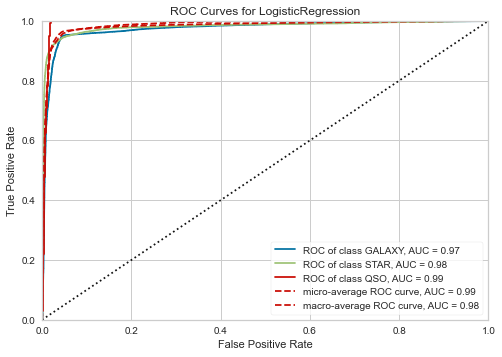

In [44]:
roauc(s)

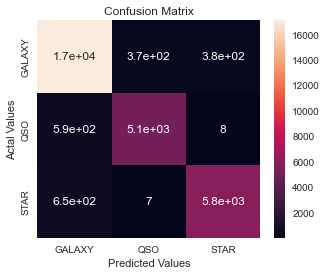

In [45]:
conf(y_test, y_pred)

In [46]:
rf_model=Pipeline(steps=[('scaler', StandardScaler()),
                ('polynomial_features', PolynomialFeatures(degree=2)),
                ('random_forest',  RandomForestClassifier(n_estimators=200))])

rf_model.get_params().keys()

NameError: name 'RandomForestClassifier' is not defined

   
 2.decison tree classifier: 
The the parameters for the grid search were: 
  criterion:[gini, entropy]   max depth: [5, 10, 15, 20]   min samples split : [2, 5] 
The best model was: {'criterion': 'entropy', 'max_depth': 20, 'min_samples_split': 2} 
And its performance: 
Accuracy: 0.9753 
 Recall array:[0.98609398, 0.91772152, 0.99614078] 
 Precision array:[0.97289223, 0.95885378, 0.99583333]  F1score array:[0.97944862, 0.93783687, 0.99598704] 


In [52]:
from sklearn.metrics import confusion_matrix, precision_recall_curve, roc_auc_score, roc_curve, accuracy_score
from sklearn.ensemble import RandomForestClassifier
rf_model=Pipeline(steps=[('scaler', StandardScaler()),
                ('polynomial_features', PolynomialFeatures(degree=2)),
                ('ridge_regression',  RandomForestClassifier(n_estimators=200))])

rf_model.fit(x_train, y_train)


Pipeline(steps=[('scaler', StandardScaler()),
                ('polynomial_features', PolynomialFeatures()),
                ('ridge_regression', RandomForestClassifier(n_estimators=200))])

In [53]:
y_pred_class_rf = rf_model.predict(x_test)
y_pred_prob_rf = rf_model.predict_proba(x_test)
model_name='tree'

print('accuracy is {:.3f}'.format(accuracy_score(y_test,y_pred_class_rf)))
print('roc-auc is {:.3f}'.format(roc_auc_score(y_test,y_pred_prob_rf, multi_class="ovr",average='weighted')))

accuracy is 0.975
roc-auc is 0.994


In [54]:
getcoffe(y_pred,y_test,'rf_model')
metrics
evaluate_metrics(y_test, y_pred)

{'accuracy': 0.9334333333333333,
 'recall': array([0.95833801, 0.89539381, 0.89827107]),
 'precision': array([0.93240589, 0.93141917, 0.93824573]),
 'f1score': array([0.94519412, 0.91305127, 0.91782334])}

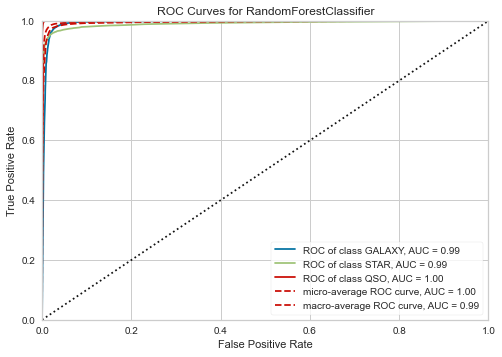

In [55]:
roauc(rf_model)

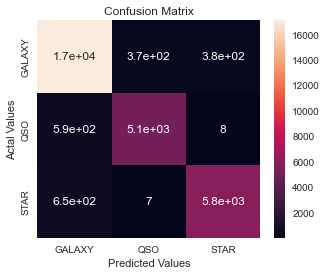

In [56]:
conf(y_test, y_pred)

3.randaom forest classifier : 
The the parameters for the grid search were: 
 n estimators':[25, 50, 100,200] 
Min samples split: [2, 5] 
The best model was: {'criterion': 'entropy', 'max_depth': 20, 'min_samples_split': 2} 
And its performance: 
accuracy: 0.9783333333333334 recall array:[0.98603791, 0.93037975, 0.99922816] precision array:[0.97775924, 0.96569343, 0.99051262] f1score array:[0.98188112, 0.94770774, 0.9948513 ] 


In [42]:
from yellowbrick.classifier import ROCAUC
def roauc(model):
 visualizer = ROCAUC(model, classes=['GALAXY', 'STAR', 'QSO'])
 visualizer.fit(x_train, y_train)        
 visualizer.score(x_test, y_test)        
 visualizer.show()              


In [43]:
def conf(y_test,y_pred):
 cm = confusion_matrix(y_test, y_pred)
 plt.figure(figsize=(5,4))
 cm_df = pd.DataFrame(cm,
                     index = ['GALAXY',  'QSO','STAR'], 
                     columns = ['GALAXY',  'QSO','STAR'])
 sns.heatmap(cm_df, annot=True)
 plt.title('Confusion Matrix')
 plt.ylabel('Actal Values')
 plt.xlabel('Predicted Values')
 recall = np.diag(cm) / np.sum(cm, axis = 1)
 precision = np.diag(cm) / np.sum(cm, axis = 0)
 plt.show()


In [191]:
model = Pipeline([
    ('sampler', PipelineHelper([('un',RandomUnderSampler(random_state=12)),('over',RandomUnderSampler()),('smote',SMOTE())
                                ,('s', StandardScaler())])),
    ('classifier',LogisticRegression( max_iter=100000))])
model.get_params().keys()

dict_keys(['memory', 'steps', 'verbose', 'sampler', 'classifier', 'sampler__available_models', 'sampler__selected_model', 'sampler__optional', 'sampler__available_models__un', 'sampler__available_models__un__random_state', 'sampler__available_models__un__replacement', 'sampler__available_models__un__sampling_strategy', 'sampler__available_models__over', 'sampler__available_models__over__random_state', 'sampler__available_models__over__replacement', 'sampler__available_models__over__sampling_strategy', 'sampler__available_models__smote', 'sampler__available_models__smote__k_neighbors', 'sampler__available_models__smote__n_jobs', 'sampler__available_models__smote__random_state', 'sampler__available_models__smote__sampling_strategy', 'sampler__available_models__s', 'sampler__available_models__s__copy', 'sampler__available_models__s__with_mean', 'sampler__available_models__s__with_std', 'classifier__C', 'classifier__class_weight', 'classifier__dual', 'classifier__fit_intercept', 'classifie

In [192]:
from sklearn.svm import SVC
from sklearn.ensemble import BaggingClassifier
from sklearn import tree
from sklearn.tree import DecisionTreeClassifier
rs='123'

def grid_search_lr(X_train, y_train):
    params_grid = {'classifier__penalty':['l1', 'l2','none'],
                   'classifier__C':[.01,.1,1],
                   'classifier__solver':['liblinear','saga']
    }
    model = Pipeline([
    ('sampler', PipelineHelper([('un',RandomUnderSampler(random_state=12)),('over',RandomUnderSampler()),('smote',SMOTE())
                                ,('s', StandardScaler())])),
    ('classifier',LogisticRegression( max_iter=100000))])
    grid_search = GridSearchCV(estimator = model, 
                           param_grid = params_grid, 
                           scoring='f1_macro',
                           cv = 3, verbose = 10)
    grid_search.fit(X_train, y_train)
    best_params = grid_search.best_params_
    
    model = grid_search.best_estimator_
    model.fit(X_train, y_train)
    y_pred = model.predict(x_test)
    conf(y_test,y_pred)
    roauc(model)
    print(evaluate_metrics(y_test, y_pred))
    return best_params

def grid_search_rf(X_train, y_train):
    params_grid = {
    'classifier__n_estimators': [25, 50, 100,200],
    'classifier__min_samples_split': [2, 5],
        
    }
      model = Pipeline([
    ('sampler', PipelineHelper([('un',RandomUnderSampler(random_state=12)),('over',RandomUnderSampler()),('smote',SMOTE())
                                ,('s', StandardScaler())])),
    ('classifier',RandomForestClassifier(random_state=123))]) 
    grid_search = GridSearchCV(estimator = model, 
                           param_grid = params_grid, 
                           scoring='f1_macro',
                           cv = 3, verbose = 10)
    grid_search.fit(X_train, y_train)
    best_params = grid_search.best_params_
    best_params = grid_search.best_params_
    
    model = grid_search.best_estimator_
    model.fit(X_train, y_train)
    y_pred = model.predict(x_test)
    conf(y_test,y_pred)
    roauc(model)
    print(evaluate_metrics(y_test, y_pred))
    return best_params
def grid_search_bg(X_train, y_train):
    param_grid = {'classifier__n_estimators': [10,20,50],
     'classifier__base_estimator__max_depth' : [20,1000] 
                 ,'classifier__base_estimator__criterion':['gini', 'entropy',]}
 
    model = Pipeline([
    ('sampler', PipelineHelper([('un',RandomUnderSampler(random_state=12)),('over',RandomUnderSampler()),('smote',SMOTE())
                                ,('s', StandardScaler())])),
    ('classifier',BaggingClassifier(base_estimator = DecisionTreeClassifier(),  bootstrap=True))])
    grid_search = GridSearchCV(estimator = model, 
                           param_grid = param_grid, 
                           scoring='f1_macro',
                           cv = 3, verbose = 10)
    grid_search.fit(X_train, y_train)
    best_params = grid_search.best_params_
    best_params = grid_search.best_params_
    
    model = grid_search.best_estimator_
    model.fit(X_train, y_train)
    y_pred = model.predict(x_test)
    conf(y_test,y_pred)
    roauc(model)
    print(evaluate_metrics(y_test, y_pred))
    return best_params
def grid_search_dt(X_train, y_train):
    params_grid = {
    'classifier__criterion':['gini', 'entropy',],
    'classifier__max_depth': [5, 10, 15, 20,],
    'classifier__min_samples_split': [2, 5],
    }
    model = Pipeline([
    ('sampler', PipelineHelper([('un',RandomUnderSampler(random_state=12)),('over',RandomUnderSampler()),('smote',SMOTE())
                                ,('s', StandardScaler())])),
    ('classifier',DecisionTreeClassifier())]) 
    grid_search = GridSearchCV(estimator = model, 
                           param_grid = params_grid, 
                           scoring='accuracy',
                           cv = 3, verbose = 10)
    grid_search.fit(X_train, y_train)
    best_params = grid_search.best_params_
    model = grid_search.best_estimator_
    model.fit(X_train, y_train)
    y_pred = model.predict(x_test)
    conf(y_test,y_pred)
    roauc(model)
    print(evaluate_metrics(y_test, y_pred))
    return best_params

    

Fitting 3 folds for each of 8 candidates, totalling 24 fits
[CV 1/3; 1/8] START min_samples_split=2, n_estimators=25........................
[CV 1/3; 1/8] END min_samples_split=2, n_estimators=25;, score=0.973 total time=   6.4s
[CV 2/3; 1/8] START min_samples_split=2, n_estimators=25........................
[CV 2/3; 1/8] END min_samples_split=2, n_estimators=25;, score=0.971 total time=   6.2s
[CV 3/3; 1/8] START min_samples_split=2, n_estimators=25........................
[CV 3/3; 1/8] END min_samples_split=2, n_estimators=25;, score=0.973 total time=   6.6s
[CV 1/3; 2/8] START min_samples_split=2, n_estimators=50........................
[CV 1/3; 2/8] END min_samples_split=2, n_estimators=50;, score=0.973 total time=  11.7s
[CV 2/3; 2/8] START min_samples_split=2, n_estimators=50........................
[CV 2/3; 2/8] END min_samples_split=2, n_estimators=50;, score=0.973 total time=  11.7s
[CV 3/3; 2/8] START min_samples_split=2, n_estimators=50........................
[CV 3/3; 2/8] 

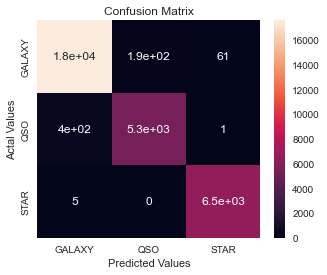

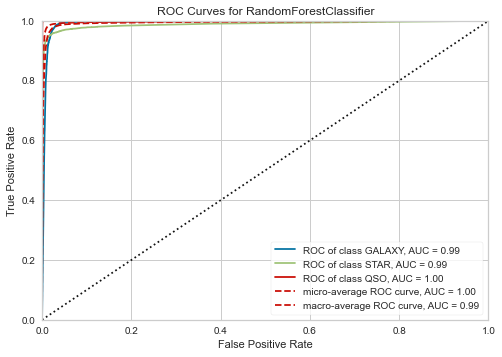

{'accuracy': 0.9783333333333334, 'recall': array([0.98603791, 0.93037975, 0.99922816]), 'precision': array([0.97775924, 0.96569343, 0.99051262]), 'f1score': array([0.98188112, 0.94770774, 0.9948513 ])}


In [59]:
rfparam=grid_search_rf(x_train,y_train)

Fitting 3 folds for each of 16 candidates, totalling 48 fits
[CV 1/3; 1/16] START criterion=gini, max_depth=5, min_samples_split=2...........
[CV 1/3; 1/16] END criterion=gini, max_depth=5, min_samples_split=2;, score=0.966 total time=   0.5s
[CV 2/3; 1/16] START criterion=gini, max_depth=5, min_samples_split=2...........
[CV 2/3; 1/16] END criterion=gini, max_depth=5, min_samples_split=2;, score=0.964 total time=   0.5s
[CV 3/3; 1/16] START criterion=gini, max_depth=5, min_samples_split=2...........
[CV 3/3; 1/16] END criterion=gini, max_depth=5, min_samples_split=2;, score=0.964 total time=   0.5s
[CV 1/3; 2/16] START criterion=gini, max_depth=5, min_samples_split=5...........
[CV 1/3; 2/16] END criterion=gini, max_depth=5, min_samples_split=5;, score=0.966 total time=   0.5s
[CV 2/3; 2/16] START criterion=gini, max_depth=5, min_samples_split=5...........
[CV 2/3; 2/16] END criterion=gini, max_depth=5, min_samples_split=5;, score=0.965 total time=   0.5s
[CV 3/3; 2/16] START criterio

[CV 3/3; 15/16] END criterion=entropy, max_depth=20, min_samples_split=2;, score=0.965 total time=   1.9s
[CV 1/3; 16/16] START criterion=entropy, max_depth=20, min_samples_split=5......
[CV 1/3; 16/16] END criterion=entropy, max_depth=20, min_samples_split=5;, score=0.965 total time=   2.2s
[CV 2/3; 16/16] START criterion=entropy, max_depth=20, min_samples_split=5......
[CV 2/3; 16/16] END criterion=entropy, max_depth=20, min_samples_split=5;, score=0.965 total time=   1.7s
[CV 3/3; 16/16] START criterion=entropy, max_depth=20, min_samples_split=5......
[CV 3/3; 16/16] END criterion=entropy, max_depth=20, min_samples_split=5;, score=0.966 total time=   1.9s


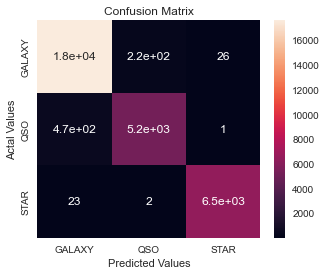

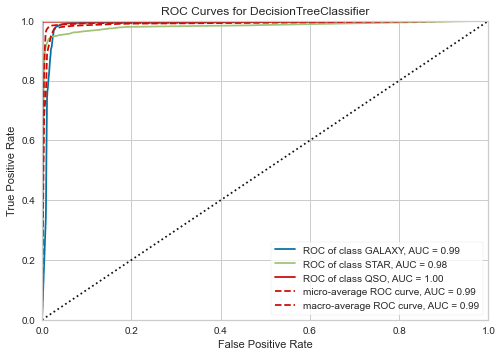

{'accuracy': 0.9753, 'recall': array([0.98609398, 0.91772152, 0.99614078]), 'precision': array([0.97289223, 0.95885378, 0.99583333]), 'f1score': array([0.97944862, 0.93783687, 0.99598704])}


In [60]:

dtparam=grid_search_dt(x_train,y_train)


Fitting 3 folds for each of 12 candidates, totalling 36 fits
[CV 1/3; 1/12] START base_estimator__criterion=gini, base_estimator__max_depth=20, n_estimators=10
[CV 1/3; 1/12] END base_estimator__criterion=gini, base_estimator__max_depth=20, n_estimators=10;, score=0.971 total time=  11.0s
[CV 2/3; 1/12] START base_estimator__criterion=gini, base_estimator__max_depth=20, n_estimators=10
[CV 2/3; 1/12] END base_estimator__criterion=gini, base_estimator__max_depth=20, n_estimators=10;, score=0.972 total time=  10.5s
[CV 3/3; 1/12] START base_estimator__criterion=gini, base_estimator__max_depth=20, n_estimators=10
[CV 3/3; 1/12] END base_estimator__criterion=gini, base_estimator__max_depth=20, n_estimators=10;, score=0.972 total time=  10.2s
[CV 1/3; 2/12] START base_estimator__criterion=gini, base_estimator__max_depth=20, n_estimators=20
[CV 1/3; 2/12] END base_estimator__criterion=gini, base_estimator__max_depth=20, n_estimators=20;, score=0.973 total time=  21.3s
[CV 2/3; 2/12] START ba

[CV 3/3; 12/12] END base_estimator__criterion=entropy, base_estimator__max_depth=1000, n_estimators=50;, score=0.975 total time=  59.1s


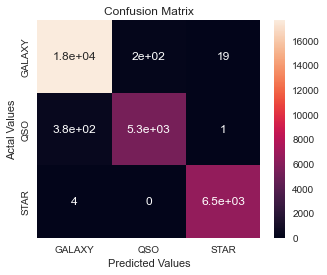

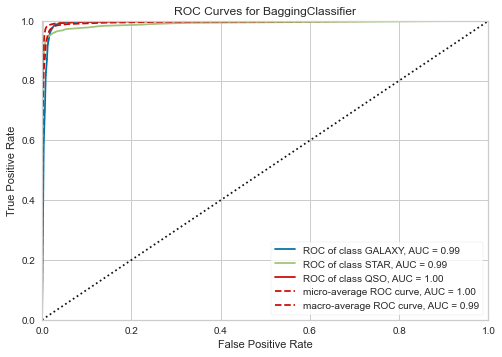

{'accuracy': 0.9799333333333333, 'recall': array([0.98772009, 0.9333685 , 0.99938253]), 'precision': array([0.97877424, 0.96369577, 0.99692023]), 'f1score': array([0.98322681, 0.94828972, 0.99814986])}


In [61]:
bgparam=grid_search_bg(x_train,y_train)


In [ ]:
from pipelinehelper import PipelineHelper
lrparam=grid_search_lr(x_train,y_train)

Fitting 3 folds for each of 18 candidates, totalling 54 fits
[CV 1/3; 1/18] START classifier__C=0.01, classifier__penalty=l1, classifier__solver=liblinear


Fitting 3 folds for each of 18 candidates, totalling 54 fits
[CV 1/3; 1/18] START C=0.01, penalty=l1, solver=liblinear.......................
[CV 1/3; 1/18] END C=0.01, penalty=l1, solver=liblinear;, score=0.908 total time=   6.5s
[CV 2/3; 1/18] START C=0.01, penalty=l1, solver=liblinear.......................
[CV 2/3; 1/18] END C=0.01, penalty=l1, solver=liblinear;, score=0.905 total time=   4.2s
[CV 3/3; 1/18] START C=0.01, penalty=l1, solver=liblinear.......................
[CV 3/3; 1/18] END C=0.01, penalty=l1, solver=liblinear;, score=0.906 total time=   4.7s
[CV 1/3; 2/18] START C=0.01, penalty=l1, solver=saga............................
[CV 1/3; 2/18] END C=0.01, penalty=l1, solver=saga;, score=0.934 total time= 3.5min
[CV 2/3; 2/18] START C=0.01, penalty=l1, solver=saga............................
[CV 2/3; 2/18] END C=0.01, penalty=l1, solver=saga;, score=0.937 total time=   4.0s
[CV 3/3; 2/18] START C=0.01, penalty=l1, solver=saga............................
[CV 3/3; 2/18] END

c:\users\hp\pycharmprojects\pythonproject5\lib\site-packages\sklearn\linear_model\_logistic.py:1484: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  "Setting penalty='none' will ignore the C and l1_ratio parameters"


[CV 1/3; 6/18] END C=0.01, penalty=none, solver=saga;, score=0.935 total time= 3.2min
[CV 2/3; 6/18] START C=0.01, penalty=none, solver=saga..........................


c:\users\hp\pycharmprojects\pythonproject5\lib\site-packages\sklearn\linear_model\_logistic.py:1484: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  "Setting penalty='none' will ignore the C and l1_ratio parameters"


[CV 2/3; 6/18] END C=0.01, penalty=none, solver=saga;, score=0.955 total time= 2.8min
[CV 3/3; 6/18] START C=0.01, penalty=none, solver=saga..........................


c:\users\hp\pycharmprojects\pythonproject5\lib\site-packages\sklearn\linear_model\_logistic.py:1484: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  "Setting penalty='none' will ignore the C and l1_ratio parameters"


[CV 3/3; 6/18] END C=0.01, penalty=none, solver=saga;, score=0.932 total time= 3.1min
[CV 1/3; 7/18] START C=0.1, penalty=l1, solver=liblinear........................
[CV 1/3; 7/18] END C=0.1, penalty=l1, solver=liblinear;, score=0.934 total time=  40.2s
[CV 2/3; 7/18] START C=0.1, penalty=l1, solver=liblinear........................
[CV 2/3; 7/18] END C=0.1, penalty=l1, solver=liblinear;, score=0.930 total time=  23.3s
[CV 3/3; 7/18] START C=0.1, penalty=l1, solver=liblinear........................
[CV 3/3; 7/18] END C=0.1, penalty=l1, solver=liblinear;, score=0.931 total time=  33.0s
[CV 1/3; 8/18] START C=0.1, penalty=l1, solver=saga.............................
[CV 1/3; 8/18] END C=0.1, penalty=l1, solver=saga;, score=0.936 total time= 3.7min
[CV 2/3; 8/18] START C=0.1, penalty=l1, solver=saga.............................
[CV 2/3; 8/18] END C=0.1, penalty=l1, solver=saga;, score=0.950 total time=  49.7s
[CV 3/3; 8/18] START C=0.1, penalty=l1, solver=saga............................

c:\users\hp\pycharmprojects\pythonproject5\lib\site-packages\sklearn\linear_model\_logistic.py:1484: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  "Setting penalty='none' will ignore the C and l1_ratio parameters"


[CV 1/3; 12/18] END C=0.1, penalty=none, solver=saga;, score=0.935 total time= 3.0min
[CV 2/3; 12/18] START C=0.1, penalty=none, solver=saga..........................


c:\users\hp\pycharmprojects\pythonproject5\lib\site-packages\sklearn\linear_model\_logistic.py:1484: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  "Setting penalty='none' will ignore the C and l1_ratio parameters"


[CV 2/3; 12/18] END C=0.1, penalty=none, solver=saga;, score=0.955 total time= 2.5min
[CV 3/3; 12/18] START C=0.1, penalty=none, solver=saga..........................


c:\users\hp\pycharmprojects\pythonproject5\lib\site-packages\sklearn\linear_model\_logistic.py:1484: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  "Setting penalty='none' will ignore the C and l1_ratio parameters"


[CV 3/3; 12/18] END C=0.1, penalty=none, solver=saga;, score=0.932 total time= 3.1min
[CV 1/3; 13/18] START C=1, penalty=l1, solver=liblinear.........................
[CV 1/3; 13/18] END C=1, penalty=l1, solver=liblinear;, score=0.947 total time= 2.0min
[CV 2/3; 13/18] START C=1, penalty=l1, solver=liblinear.........................
[CV 2/3; 13/18] END C=1, penalty=l1, solver=liblinear;, score=0.943 total time= 1.0min
[CV 3/3; 13/18] START C=1, penalty=l1, solver=liblinear.........................
[CV 3/3; 13/18] END C=1, penalty=l1, solver=liblinear;, score=0.943 total time= 1.8min
[CV 1/3; 14/18] START C=1, penalty=l1, solver=saga..............................
[CV 1/3; 14/18] END C=1, penalty=l1, solver=saga;, score=0.935 total time= 3.8min
[CV 2/3; 14/18] START C=1, penalty=l1, solver=saga..............................
[CV 2/3; 14/18] END C=1, penalty=l1, solver=saga;, score=0.955 total time= 2.9min
[CV 3/3; 14/18] START C=1, penalty=l1, solver=saga..............................
[CV

c:\users\hp\pycharmprojects\pythonproject5\lib\site-packages\sklearn\model_selection\_validation.py:372: FitFailedWarning: 
9 fits failed out of a total of 54.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
9 fits failed with the following error:
Traceback (most recent call last):
  File "c:\users\hp\pycharmprojects\pythonproject5\lib\site-packages\sklearn\model_selection\_validation.py", line 680, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "c:\users\hp\pycharmprojects\pythonproject5\lib\site-packages\sklearn\linear_model\_logistic.py", line 1461, in fit
    solver = _check_solver(self.solver, self.penalty, self.dual)
  File "c:\users\hp\pycharmprojects\pythonproject5\lib\site-packages\sklearn\linear_mode

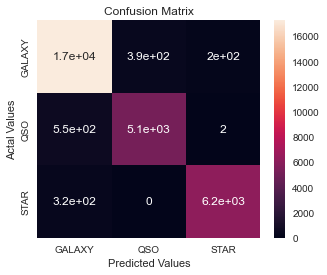

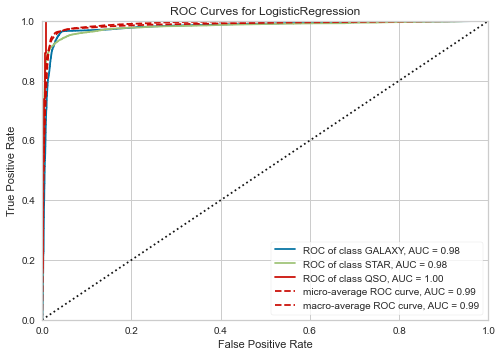

{'accuracy': 0.9511333333333334, 'recall': array([0.96691712, 0.90225035, 0.95060204]), 'precision': array([0.95176068, 0.92937342, 0.96823899]), 'f1score': array([0.95927904, 0.91561106, 0.95933946])}


In [62]:
lrparam=grid_search_lr(x_train,y_train)

In [96]:
def plotmodel(model,x_train,y_train,x_test):
    model.fit(x_train, y_train)
    y_pred = model.predict(x_test)
    conf(y_test,y_pred)
    roauc(model)
    for x in evaluate_metrics(y_test, y_pred):
        print (x)
    
    

In [69]:
bgparam

{'base_estimator__criterion': 'entropy',
 'base_estimator__max_depth': 20,
 'n_estimators': 50}

In [3]:

dt=DecisionTreeClassifier(max_depth= 10, min_samples_split= 2,criterion= 'entropy')

NameError: name 'dtparam' is not defined

In [5]:
from sklearn.linear_model import LogisticRegression
lr=LogisticRegression( max_iter=1000)

In [ ]:
rf=RandomForestClassifier(min_samples_split= 5, n_estimators= 50)


 
 
4-bagging classifier:  
The base estimator was a decision tree and the parameters for the grid search were: 
N estimators': [10,20,50], 
 Base estimator max depth' : [20,1000]  
 Base estimator criterion:['gini', 'entropy',] 
The best model was: {'criterion': 'entropy', 'max_depth': 20, 'min_samples_split': 2} 
And its performance: 
accuracy: 0.9799333333333333 recall array:[0.98772009, 0.9333685 , 0.99938253 ] precision array:[0.97877424, 0.96369577, 0.99692023] f1score array:[0.98322681, 0.94828972, 0.99814986]) 

In [ ]:

bg = BaggingClassifier(base_estimator = DecisionTreeClassifier(criterion='entropy',max_depth= 20),  bootstrap=True, n_estimators= 50)


In [78]:
from imblearn.over_sampling import *
from imblearn.under_sampling import RandomUnderSampler 
smote_sampler = SMOTE(random_state = 12)
x_smo, y_smo = smote_sampler.fit_resample(X_train, y_train)
under_sampler=RandomUnderSampler(random_state=12)
x_under, y_under=under_sampler.fit_resample(X_train, y_train)
over_sampler=RandomOverSampler(random_state=12)
x_over, y_over=over_sampler.fit_resample(X_train, y_train)


normal DecisionTreeClassifier


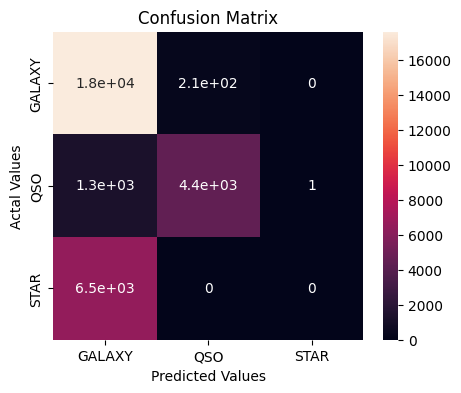

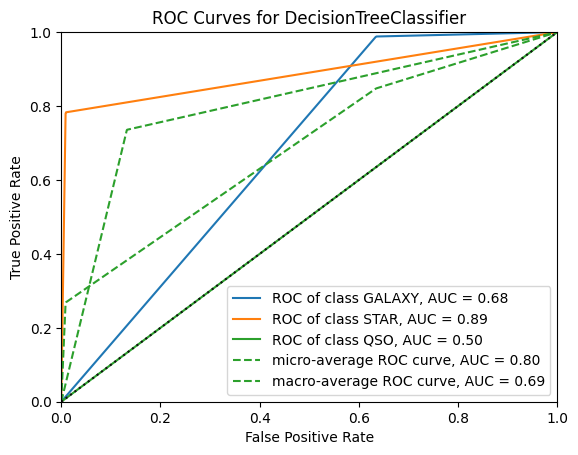

accuracy
recall
precision
f1score
smote DecisionTreeClassifier


c:\users\hp\pycharmprojects\pythonproject5\lib\site-packages\sklearn\preprocessing\_data.py:948: RuntimeWarning: invalid value encountered in sqrt
  np.sqrt(self.var_), copy=False, constant_mask=constant_mask


KeyboardInterrupt: 

In [184]:
models=[dt,lr,rf,bg]
samples=[[x_train,y_train,'normal'],[x_smo, y_smo,'smote'],[x_under, y_under,'under'],[x_over, y_over,'over']]
for model in models:
    for x in samples:
        s=StandardScaler()
        print(x[2],type(model).__name__)
        x[0]=s.fit_transform(x[0])
        x_test=s.transform(x_test)
        plotmodel(model,x[0],x[1],x_test)

    

normal DecisionTreeClassifier


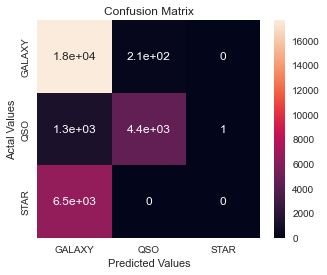

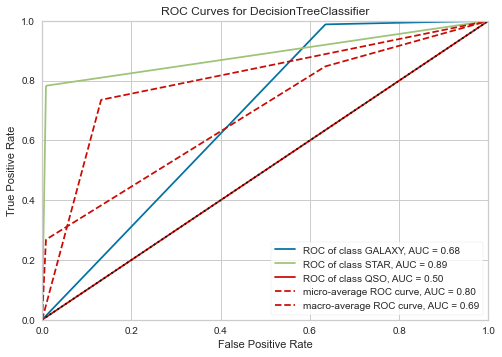

accuracy
recall
precision
f1score
smote DecisionTreeClassifier


c:\users\hp\pycharmprojects\pythonproject5\lib\site-packages\sklearn\preprocessing\_data.py:948: RuntimeWarning: invalid value encountered in sqrt
  np.sqrt(self.var_), copy=False, constant_mask=constant_mask


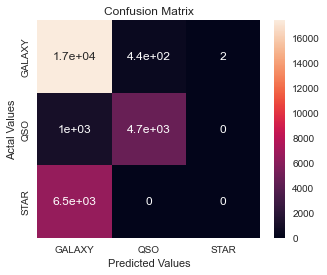

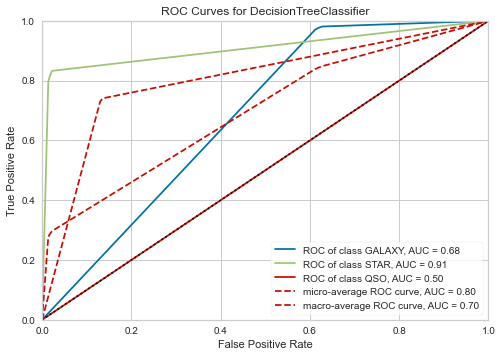

accuracy
recall
precision
f1score
under DecisionTreeClassifier


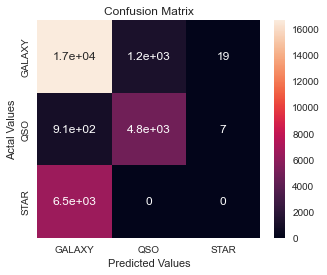

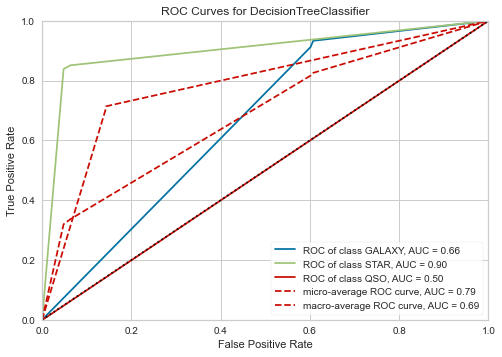

accuracy
recall
precision
f1score
over DecisionTreeClassifier


c:\users\hp\pycharmprojects\pythonproject5\lib\site-packages\sklearn\preprocessing\_data.py:948: RuntimeWarning: invalid value encountered in sqrt
  np.sqrt(self.var_), copy=False, constant_mask=constant_mask


KeyboardInterrupt: 

In [97]:
models=[dt,lr,rf,bg]
samples=[[x_train,y_train,'normal'],[x_smo, y_smo,'smote'],[x_under, y_under,'under'],[x_over, y_over,'over']]
for model in models:
    for x in samples:
        s=StandardScaler()
        print(x[2],type(model).__name__)
        x[0]=s.fit_transform(x[0])
        x_test=s.transform(x_test)
        plotmodel(model,x[0],x[1],x_test)

Fitting 3 folds for each of 16 candidates, totalling 48 fits
[CV 1/3; 1/16] START criterion=gini, max_depth=5, min_samples_split=2...........
[CV 1/3; 1/16] END criterion=gini, max_depth=5, min_samples_split=2;, score=0.965 total time=   0.7s
[CV 2/3; 1/16] START criterion=gini, max_depth=5, min_samples_split=2...........
[CV 2/3; 1/16] END criterion=gini, max_depth=5, min_samples_split=2;, score=0.962 total time=   0.8s
[CV 3/3; 1/16] START criterion=gini, max_depth=5, min_samples_split=2...........
[CV 3/3; 1/16] END criterion=gini, max_depth=5, min_samples_split=2;, score=0.966 total time=   0.8s
[CV 1/3; 2/16] START criterion=gini, max_depth=5, min_samples_split=5...........
[CV 1/3; 2/16] END criterion=gini, max_depth=5, min_samples_split=5;, score=0.965 total time=   0.7s
[CV 2/3; 2/16] START criterion=gini, max_depth=5, min_samples_split=5...........
[CV 2/3; 2/16] END criterion=gini, max_depth=5, min_samples_split=5;, score=0.962 total time=   0.7s
[CV 3/3; 2/16] START criterio

[CV 3/3; 15/16] END criterion=entropy, max_depth=20, min_samples_split=2;, score=0.988 total time=   1.9s
[CV 1/3; 16/16] START criterion=entropy, max_depth=20, min_samples_split=5......
[CV 1/3; 16/16] END criterion=entropy, max_depth=20, min_samples_split=5;, score=0.983 total time=   1.7s
[CV 2/3; 16/16] START criterion=entropy, max_depth=20, min_samples_split=5......
[CV 2/3; 16/16] END criterion=entropy, max_depth=20, min_samples_split=5;, score=0.985 total time=   1.9s
[CV 3/3; 16/16] START criterion=entropy, max_depth=20, min_samples_split=5......
[CV 3/3; 16/16] END criterion=entropy, max_depth=20, min_samples_split=5;, score=0.986 total time=   1.9s


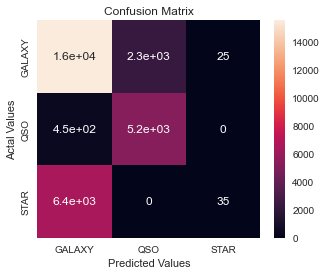

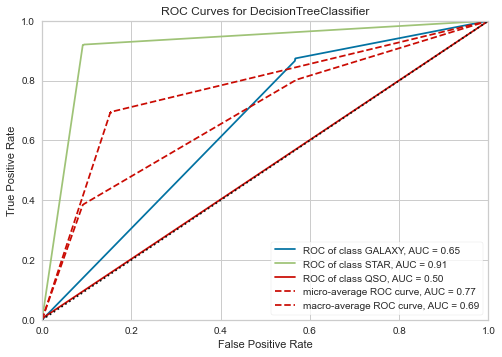

{'accuracy': 0.6928666666666666, 'recall': array([0.86985533, 0.92088608, 0.0054029 ]), 'precision': array([0.69235919, 0.69524821, 0.58333333]), 'f1score': array([0.77102386, 0.79231584, 0.01070664])}


In [99]:

dtparam=grid_search_dt(x_over, y_over)

In [105]:
from sklearn.inspection import permutation_importance, plot_partial_dependence
feature_importances = permutation_importance(estimator=bg, X = x_train, y = y_train, n_repeats=5,
                                random_state=123, n_jobs=2)

In [103]:
dt

DecisionTreeClassifier(criterion='entropy', max_depth=10)

In [6]:
def visualize_feature_importance(importance_array):
    # Sort the array based on mean value
    sorted_idx = importance_array.importances_mean.argsort()
    # Visualize the feature importances using boxplot
    fig, ax = plt.subplots()
    fig.set_figwidth(16)
    fig.set_figheight(10)
    fig.tight_layout()
    ax.boxplot(importance_array.importances[sorted_idx].T,
               vert=False, labels=X_data.columns[sorted_idx])
    ax.set_title("Permutation Importances (train set)")
    plt.show()

In [8]:
X_data = data[feature_cols]

In [9]:
visualize_feature_importance(feature_importances)

NameError: name 'feature_importances' is not defined

In [12]:
lr.fit(x_train, y_train)

LogisticRegression(max_iter=1000)

In [28]:
def get_feature_coefs(regression_model, label_index, columns):
    coef_dict = {}
    for coef, feat in zip(regression_model.coef_[label_index, :], columns):
        if abs(coef) >= 0.01:
            coef_dict[feat] = coef
    # Sort coefficients
    coef_dict = {k: v for k, v in sorted(coef_dict.items(), key=lambda item: item[1])}
    return coef_dict

# Generate bar colors based on if value is negative or positive
def get_bar_colors(values):
    color_vals = []
    for val in values:
        if val <= 0:
            color_vals.append('r')
        else:
            color_vals.append('g')
    return color_vals

# Visualize coefficients
def visualize_coefs(coef_dict):
    features = list(coef_dict.keys())
    values = list(coef_dict.values())
    y_pos = np.arange(len(features))
    color_vals = get_bar_colors(values)
    plt.rcdefaults()
    fig, ax = plt.subplots()
    ax.barh(y_pos, values, align='center', color=color_vals)
    ax.set_yticks(y_pos)
    ax.set_yticklabels(features)
    # labels read top-to-bottom
    ax.invert_yaxis()  
    ax.set_xlabel('Feature Coefficients '+lr.classes_[0])
    ax.set_title('')
    plt.show()

In [29]:
coef_dict = get_feature_coefs(lr, 0, feature_cols)

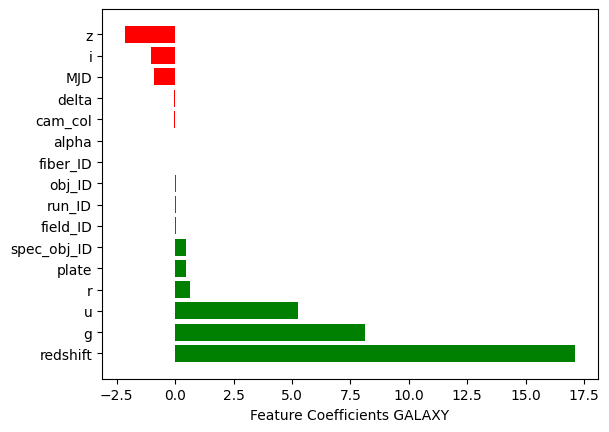

In [30]:
visualize_coefs(coef_dict)

 
Summary: 
As seen for the performance the basic logistic regression model is doing well enough in this dataset so it eliminates the need for the more complicated models in terms of explain ability and hardware requirements. Since more complex models offer slight increase in performance for harder to explain model and higher hardware requirement 
Summary of Key Findings     :  
The goal of the model is to classify celestial bodies into 3 categories. And also deciding which attributes have the most information  for classification . 
It was found that the classes that have simple enough boundaries that they can be classified with good performance using a basic logistic regression model.    
As expected the columns that recorded the data related to observation contributed so little in the classification task this can be seen in the feature importance and feature coefficients for each class : 
   

  
     It can also be seen that the red shift followed by the g ,u and z column had the most impact in differentiate between the classes. The impact is high enough that a module can have acceptable results training only on these features.  
Future work: 
A simpler model can be trained on this data by using  principle component analysis the training and prediction can be even faster without losing much of the performance. 
It is also possible to train even more complex model on the most contributing features using 2nd or 3rd degree features do produce even better performance.      
 
 
